In [1]:
from pandas import ExcelFile
import geopandas as gpd
from pandas import read_csv
from pandas import DataFrame
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from PaddockTS.Data.environmental import download_environmental_data
from PaddockTS.get_outputs import get_outputs
from PaddockTS.query import Query

2025-09-06 19:09:50.642366: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
xlsx = ExcelFile('/g/data/xe2/ya6227/NVTAnalysis/data/NVT.xlsx')
df = xlsx.parse('Canola')

In [3]:
def plot_experiments_across_australia(df: DataFrame):
    gdf = gpd.GeoDataFrame(
        df, 
        geometry=gpd.points_from_xy(
        df['Trial GPS Long'],
        df['Trial GPS Lat']),
        crs="EPSG:4326"
    )
    aus_states = gpd.read_file("/g/data/xe2/ya6227/NVTAnalysis/data/gadm41_AUS_1.shp")
    gdf_filtered = gdf.dropna(subset=["Single Site Yield", "RegionName"])

    gdf_filtered = gdf.dropna(subset=["Single Site Yield", "RegionName"])

    # Group by GPS + Region to get average yield per site
    gdf_grouped = (
        gdf_filtered.groupby(["Trial GPS Lat", "Trial GPS Long", "RegionName"])
        .agg({
            "Single Site Yield": "mean",
            "geometry": "first"
        })
        .reset_index()
    )
    
    # Convert back to GeoDataFrame
    gdf_grouped = gpd.GeoDataFrame(gdf_grouped, geometry="geometry", crs="EPSG:4326")
    
    # Normalize marker size
    min_size, max_size = 20, 200
    yield_min = gdf_grouped["Single Site Yield"].min()
    yield_max = gdf_grouped["Single Site Yield"].max()
    gdf_grouped["marker_size"] = gdf_grouped["Single Site Yield"].apply(
        lambda y: min_size + (y - yield_min) / (yield_max - yield_min) * (max_size - min_size)
    )
    
    
    unique_regions = gdf_grouped["RegionName"].unique()
    num_regions = len(unique_regions)
    colormap = cm.get_cmap("tab20", num_regions)  # You can also try "hsv" or "tab20b"
    
    # Create region → color map using hex codes
    region_colors = {
        region: mcolors.to_hex(colormap(i)) for i, region in enumerate(unique_regions)
    }
    
    # Plot
    fig, ax = plt.subplots(figsize=(16, 16))
    aus_states.plot(ax=ax, color='white', edgecolor='black')
    
    for region, group in gdf_grouped.groupby("RegionName"):
        group.plot(
            ax=ax,
            color=region_colors[region],
            markersize=group["marker_size"],
            edgecolor="black",
            alpha=0.7,
            label=region
        )
    
    ax.set_title("NVT Trial Sites by Region with Yield-based Marker Size (2017–2024)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
    # plt.grid(True)
    # plt.tight_layout()
    # plt.show()
        

/g/data/xe2/ya6227/tmp/ipykernel_2509457/3286352535.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("tab20", num_regions)  # You can also try "hsv" or "tab20b"


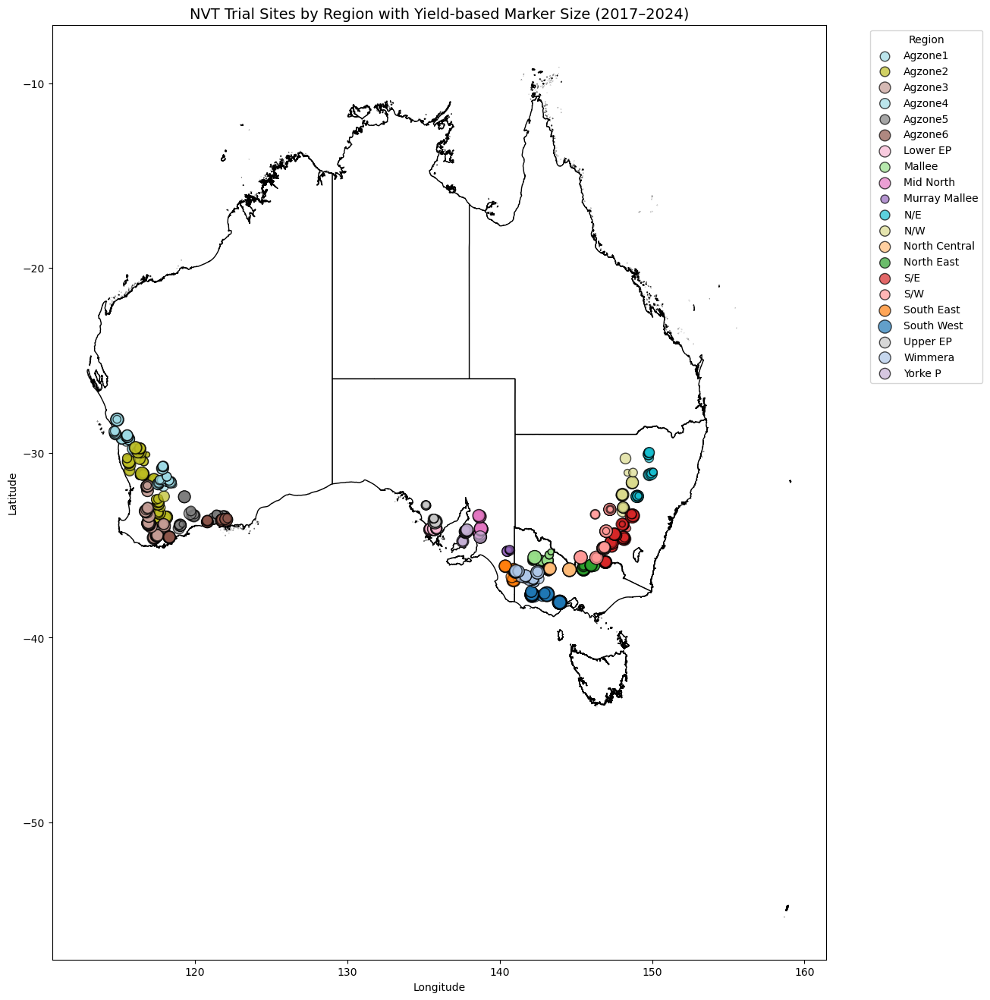

In [4]:
plot_experiments_across_australia(df)

In [5]:
def get_variety_counts(df: DataFrame):
    varieties = df['VarietyDisplayName'].unique().tolist()
    variety_counts = {}
    for variety in varieties:
        variety_counts[variety] = df[df['VarietyDisplayName'] == variety].shape[0]
    sorted_variety_counts = dict(sorted(variety_counts.items(), key=lambda item: item[1], reverse=True))
    return sorted_variety_counts

In [6]:
list(get_variety_counts(df).keys())[0]

'HyTTec Trophy'

In [7]:
df_variety = df[df['VarietyDisplayName'] == 'HyTTec Trophy']

In [8]:
def download_variety_data(df_var: DataFrame, var: str):
    for idx, row in df_var.iterrows():
        query = Query(
            lat=row['Trial GPS Lat'],
            lon=row['Trial GPS Long'],
            buffer=0.01,
            start_time=row['SowingDate'].date(),
            end_time=row['HarvestDate'].date(),
            collections=['ga_s2am_ard_3', 'ga_s2bm_ard_3'],
            bands=[
                'nbart_blue',
                'nbart_green',
                'nbart_red',
                'nbart_red_edge_1',
                'nbart_red_edge_2',
                'nbart_red_edge_3',
                'nbart_nir_1',
                'nbart_nir_2',
                'nbart_swir_2',
                'nbart_swir_3'
            ],
            stub=f"{var}-{str(idx)}",
            tmp_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim',
            out_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim'
        )


In [10]:
df_variety

,Year,Crop.Name,State,RegionName,SiteDescription,TrialCode,SeriesName,Orientation,Company.Name,Trial GPS Lat,...,Probability,Error Mean Squared,1000 grain weight,Protein - Seed (raw),Protein Meal (10% moisture),Glucosinolate,Grain Moisture Content,Oil - Seed (6% moisture),Oil (raw),Protein Seed (10% moisture)
16,2017,Canola,NSW,N/E,Bellata,CLTA17BELL2,Low-Med Rainfall Triazine,West,NVT,-29.993147,...,0.0143951170422882,0.008355,NaN,22.8,37.790055,NaN,5.9,39.757705,39.8,21.806589
40,2017,Canola,NSW,N/E,Mullaley,CHTA17MULL2,Med-High Rainfall Triazine,West,NVT,-31.138494,...,<0.001,0.009244,NaN,25.5,44.134615,NaN,7.4,41.213823,40.6,24.784017
58,2017,Canola,NSW,N/E,Wellington,CHTA17WELL2,Med-High Rainfall Triazine,West,NVT,-32.331580,...,<0.001,0.012803,NaN,29.5,50.862069,NaN,10.3,39.297659,37.5,29.598662
76,2017,Canola,NSW,N/W,Coonamble,CLTA17COOA2,Low-Med Rainfall Triazine,South,NVT,-31.075240,...,0.00374685603827229,0.006100,NaN,23.6,41.484375,NaN,6.0,42.800000,42.8,22.595745
109,2017,Canola,NSW,N/W,Parkes,CHTA17PARK2,Med-High Rainfall Triazine,North West,NVT,-32.949630,...,<0.001,0.005918,NaN,24.6,43.242188,NaN,5.9,42.854410,42.9,23.528162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14481,2024,Canola,WA,Agzone5,Hyden,CLTA24HYDE6,Low-Med Rainfall Triazine,Unspecified,NVT,-32.378283,...,<0.001,0.011592,NaN,18.2,33.292682,NaN,5.8,44.904458,45.0,17.388535
14512,2024,Canola,WA,Agzone5,Jerramungup,CLTA24JERR6,Low-Med Rainfall Triazine,Unspecified,NVT,-33.924578,...,<0.001,0.017128,NaN,19.8,36.146044,NaN,8.6,43.297592,42.1,19.496717
14543,2024,Canola,WA,Agzone5,Mt. Madden,CLTA24MADD6,Low-Med Rainfall Triazine,Unspecified,NVT,-33.400973,...,<0.001,0.014329,NaN,19.5,34.890656,NaN,4.4,44.541841,45.3,18.357740
14580,2024,Canola,WA,Agzone6,Gibson,CHTA24GIBS6,Med-High Rainfall Triazine,Unspecified,NVT,-33.578755,...,<0.001,0.013103,NaN,23.0,40.588235,NaN,9.0,41.318681,40.0,22.747252


In [11]:
loc = 5990
row = df.loc[loc]
var = 'HyTTec Trophy'

In [12]:
query = Query(
    lat=row['Trial GPS Lat'],
    lon=row['Trial GPS Long'],
    buffer=0.01,
    start_time=row['SowingDate'].date(),
    end_time=row['HarvestDate'].date(),
    collections=[
        'ga_s2am_ard_3',
        'ga_s2bm_ard_3'
    ],
    bands=[
        'nbart_blue',
        'nbart_green',
        'nbart_red',
        'nbart_red_edge_1',
        'nbart_red_edge_2',
        'nbart_red_edge_3',
        'nbart_nir_1',
        'nbart_nir_2',
        'nbart_swir_2',
        'nbart_swir_3'
    ],
    stub=f"{var}-{str(loc)}",
    tmp_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim',
    out_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim'
)

In [14]:
get_outputs(query)

/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990/ds2.pkl HyTTec Trophy-5990


2025-08-20 01:25:44,987 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('nbart_red_edge_3-ea2da09d1d2d313cc114df2cd7fab582', 10, 0, 0))" coro=<Worker.execute() done, defined at /g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/distributed/worker_state_machine.py:3607>> ended with CancelledError
2025-08-20 01:25:44,988 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('nbart_red_edge_3-ea2da09d1d2d313cc114df2cd7fab582', 1, 0, 0))" coro=<Worker.execute() done, defined at /g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/distributed/worker_state_machine.py:3607>> ended with CancelledError
2025-08-20 01:25:44,988 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('nbart_red_edge_3-ea2da09d1d2d313cc114df2cd7fab582', 11, 0, 0))" coro=<Worker.execute() done, defined at /g/data/xe2/ya6227/min

KeyboardInterrupt: 

Process Dask Worker process (from Nanny):
2025-08-20 01:25:51,435 - distributed.nanny - ERROR - Worker process died unexpectedly
Traceback (most recent call last):
  File "/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/distributed/process.py", line 202, in _run
    target(*args, **kwargs)
  File "/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/distributed/nanny.py", line 1023, in _run
    asyncio_run(run(), loop_factory=get_loop_factory())
  File "/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/distributed/compatibility.py", line 236, in asyncio_run
    return loop.run_until_complete(main)
  File "/g/da

In [15]:
from PaddockTS.Plotting.checkpoint_plots import plot

/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990/DS2I.pkl
Exporting image to /g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990/checkpoints/HyTTec Trophy-5990_thumbs_rgb.png
Exporting image to /g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990/checkpoints/HyTTec Trophy-5990_thumbs_vegfrac.png


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.0 x 6.932642487046633 to 6.0 x 6.92
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x692 -pix_fmt rgba -framerate 10 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y '/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990/checkpoints/HyTTec Trophy-5990_manpad_RGB.mp4'
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.0 x 6.932642487046633 to 6.0 x 6.92
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x692 -pix_fmt rgba -framerate 10 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y '/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990/checkpoints/HyTTec Trophy-5990_manpad_v

Normalizing all frames by reference max = 0.948


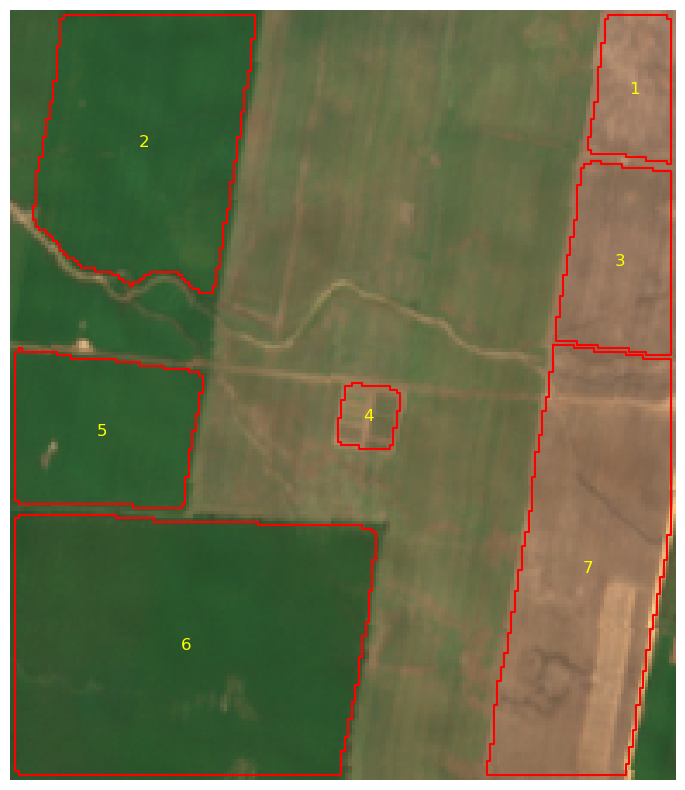

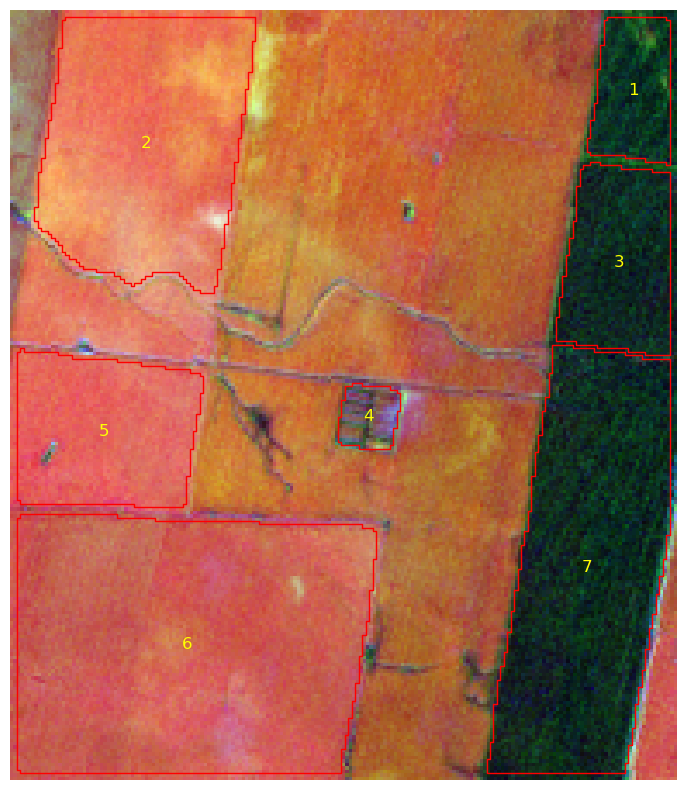

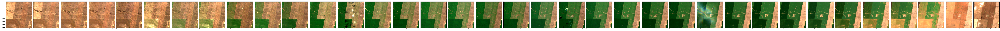

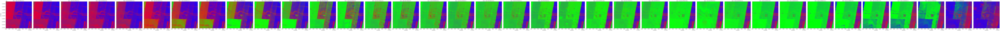

In [16]:
plot(query)

In [13]:
 query

Query(lat=-29.97867, lon=149.81617, buffer=0.01, start_time=datetime.date(2021, 5, 21), end_time=datetime.date(2021, 12, 2), collections=['ga_s2am_ard_3', 'ga_s2bm_ard_3'], bands=['nbart_blue', 'nbart_green', 'nbart_red', 'nbart_red_edge_1', 'nbart_red_edge_2', 'nbart_red_edge_3', 'nbart_nir_1', 'nbart_nir_2', 'nbart_swir_2', 'nbart_swir_3'], filter=Filter(op='<', args=[{'property': 'eo:cloud_cover'}, 10]), crs='EPSG:6933', groupby='solar_day', resolution=10, stub='HyTTec Trophy-5990', out_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim', tmp_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim', x=149.81617, y=-29.97867, centre=(149.81617, -29.97867), lon_range=(-29.988670000000003, -29.96867), lat_range=(149.80617, 149.82617), datetime='2021-05-21/2021-12-02', bbox=[149.80617, -29.988670000000003, 149.82617, -29.96867], stub_tmp_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990', stub_out_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990', path_ds2='/g/da

In [14]:
query.path_polygons

'/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/HyTTec Trophy-5990/polygons.gpkg'